# EDA: Part 1 -- Cohort 1 Wave 2

Outline of EDA:
1. Prepare X and Y datasets
2. Univariate Analysis    
    - Services by demographics
    - Outcomes by demographics    
3. Bivariate Analysis
    - Relationships w/in feaatures
    - Relationships w/in targets
    - Relationships between targets vs. features

In [1]:
# Loading needed libraries and tools...

import pandas as pd
import seaborn as sns
import numpy as np
from matplotlib import pyplot as plt
import math
import psycopg2 as psy
from sqlalchemy import create_engine
from sqlalchemy.engine.url import URL
import pandas.io.sql as psql
import seaborn as sns
from sklearn import preprocessing
%matplotlib inline


In [2]:
# Loading data from local postgres DB...

In [3]:
connection = psy.connect("dbname=nytd_clean_data user=cguy")

cohort_1 = psql.read_sql("SELECT * FROM cohort_1", connection)

In [4]:
cohort_1 = cohort_1.drop('index',axis=1)
cohort_1.head()

,Wave,StFCID,RepDate_outcomes,OutcmRpt,OutcmDte,OutcmFCS,CurrFTE,CurrPTE,EmplySklls,SocSecrty,...,HlthEdSv,FamSuppSv,MentorSv,SILsv,RmBrdFASv,EducFinaSv,OthrFinaSv,Race,RaceEthn,AgeMP
0,Wave 1: Age 17 Baseline Survey,AK450290395006,2011-03-01,Youth participated,2010-10-08,"Yes, is in FC on Date",No,No,No,"Yes, is receiving SSI or SSDI payments",...,0,0,0,0,0,0,1,1,1,17
1,Wave 1: Age 17 Baseline Survey,AK450290395006,2011-03-01,Youth participated,2010-10-08,"Yes, is in FC on Date",No,No,No,"Yes, is receiving SSI or SSDI payments",...,0,0,0,0,0,0,1,1,1,17
2,Wave 2: Age 19 Followup,AK450290395006,2013-03-01,Youth participated,2012-12-28,"No, is not in FC on Date",No,No,No,No,...,0,0,0,0,0,0,1,1,1,17
3,Wave 2: Age 19 Followup,AK450290395006,2013-03-01,Youth participated,2012-12-28,"No, is not in FC on Date",No,No,No,No,...,0,0,0,0,0,0,1,1,1,17
4,Wave 1: Age 17 Baseline Survey,AK450448396586,2011-03-01,Youth participated,2010-12-28,"Yes, is in FC on Date",No,No,Yes,No,...,0,0,0,0,0,0,0,3,3,17


In [5]:
wave_stID = cohort_1[['Wave', 'StFCID']]
wave_stID.head()

,Wave,StFCID
0,Wave 1: Age 17 Baseline Survey,AK450290395006
1,Wave 1: Age 17 Baseline Survey,AK450290395006
2,Wave 2: Age 19 Followup,AK450290395006
3,Wave 2: Age 19 Followup,AK450290395006
4,Wave 1: Age 17 Baseline Survey,AK450448396586


# 1) Examine data and create X and Y datasets: 

In [7]:
c1w1 = cohort_1.loc[cohort_1['Wave'] == "Wave 1: Age 17 Baseline Survey"]
c1w2 = cohort_1.loc[cohort_1['Wave'] == "Wave 2: Age 19 Followup"]
c1w1.describe()

,Weight,FY,StFIPS,Sex,AmIAKN,Asian,BlkAfrAm,HawaiiPI,White,RaceUnkn,...,HlthEdSv,FamSuppSv,MentorSv,SILsv,RmBrdFASv,EducFinaSv,OthrFinaSv,Race,RaceEthn,AgeMP
count,12018.000000,22111.0,22111.000000,22111.000000,22111.000000,22111.000000,22111.000000,22111.00000,22111.000000,22111.000000,...,22111.000000,22111.000000,22111.000000,22111.000000,22111.000000,22111.000000,22111.000000,22111.000000,22111.000000,22111.000000
mean,2.015134,2011.0,24.522455,1.506897,0.033603,0.015241,0.352132,0.00493,0.530143,1.455294,...,12.439103,12.380173,12.286192,12.194609,12.192936,12.219619,12.273167,11.988422,5.280494,16.560355
std,1.465403,0.0,17.300343,0.499964,0.180210,0.122514,0.477646,0.07004,0.499102,10.436163,...,27.925521,27.950643,27.990404,28.028794,28.029492,28.018345,27.995886,29.961278,15.140712,0.528911
min,0.700000,2011.0,1.000000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,14.000000
25%,NaN,2011.0,6.000000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,16.000000
50%,NaN,2011.0,22.000000,2.000000,0.000000,0.000000,0.000000,0.00000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2.000000,17.000000
75%,NaN,2011.0,36.000000,2.000000,0.000000,0.000000,1.000000,0.00000,1.000000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,2.000000,6.000000,17.000000
max,18.650000,2011.0,72.000000,2.000000,1.000000,1.000000,1.000000,1.00000,1.000000,77.000000,...,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,99.000000,99.000000,20.000000


In [8]:
c1w2.describe()

,Weight,FY,StFIPS,Sex,AmIAKN,Asian,BlkAfrAm,HawaiiPI,White,RaceUnkn,...,HlthEdSv,FamSuppSv,MentorSv,SILsv,RmBrdFASv,EducFinaSv,OthrFinaSv,Race,RaceEthn,AgeMP
count,7280.000000,11906.0,11906.000000,11906.000000,11906.000000,11906.000000,11906.000000,11906.000000,11906.000000,11906.000000,...,11906.000000,11906.000000,11906.000000,11906.000000,11906.000000,11906.000000,11906.000000,11906.000000,11906.000000,11906.000000
mean,3.530985,2011.0,24.591886,1.510331,0.042332,0.014111,0.338821,0.005627,0.573156,0.467579,...,3.875777,3.810180,3.710398,3.577524,3.592306,3.622291,3.681253,9.035612,3.963716,16.512347
std,3.376826,0.0,16.405165,0.499914,0.201353,0.117952,0.473329,0.074808,0.494640,5.887108,...,16.008149,16.021843,16.042136,16.068158,16.065320,16.059519,16.047942,25.736902,11.456084,0.500204
min,0.880000,2011.0,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,16.000000
25%,NaN,2011.0,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,16.000000
50%,NaN,2011.0,22.000000,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,17.000000
75%,NaN,2011.0,37.000000,2.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,...,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,3.000000,17.000000
max,80.710000,2011.0,56.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,77.000000,...,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,99.000000,99.000000,18.000000


In [9]:
c1w1_noDups = c1w1.drop_duplicates('StFCID')

In [10]:
c1w1_noDups.describe()

,Weight,FY,StFIPS,Sex,AmIAKN,Asian,BlkAfrAm,HawaiiPI,White,RaceUnkn,...,HlthEdSv,FamSuppSv,MentorSv,SILsv,RmBrdFASv,EducFinaSv,OthrFinaSv,Race,RaceEthn,AgeMP
count,7405.000000,13743.0,13743.000000,13743.000000,13743.000000,13743.000000,13743.000000,13743.000000,13743.000000,13743.000000,...,13743.000000,13743.000000,13743.000000,13743.000000,13743.000000,13743.000000,13743.000000,13743.000000,13743.000000,13743.000000
mean,1.995284,2011.0,23.951830,1.504475,0.034490,0.015135,0.353489,0.005166,0.526232,1.379102,...,10.836499,10.774358,10.683985,10.593102,10.586408,10.616168,10.675689,12.199738,5.140872,16.711999
std,1.396944,0.0,17.121035,0.499998,0.182491,0.122094,0.478070,0.071693,0.499330,10.167792,...,26.335660,26.359967,26.395016,26.429904,26.432460,26.421084,26.398215,30.220365,14.729140,0.478629
min,0.700000,2011.0,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,14.000000
25%,NaN,2011.0,6.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,16.000000
50%,NaN,2011.0,22.000000,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2.000000,17.000000
75%,NaN,2011.0,36.000000,2.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,2.000000,6.000000,17.000000
max,18.650000,2011.0,72.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,77.000000,...,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,99.000000,99.000000,20.000000


In [11]:
c1w1_noDups.head()

,Wave,StFCID,RepDate_outcomes,OutcmRpt,OutcmDte,OutcmFCS,CurrFTE,CurrPTE,EmplySklls,SocSecrty,...,HlthEdSv,FamSuppSv,MentorSv,SILsv,RmBrdFASv,EducFinaSv,OthrFinaSv,Race,RaceEthn,AgeMP
0,Wave 1: Age 17 Baseline Survey,AK450290395006,2011-03-01,Youth participated,2010-10-08,"Yes, is in FC on Date",No,No,No,"Yes, is receiving SSI or SSDI payments",...,0,0,0,0,0,0,1,1,1,17
4,Wave 1: Age 17 Baseline Survey,AK450448396586,2011-03-01,Youth participated,2010-12-28,"Yes, is in FC on Date",No,No,Yes,No,...,0,0,0,0,0,0,0,3,3,17
8,Wave 1: Age 17 Baseline Survey,AK450461296715,2011-03-01,Not in sample,NaT,"Yes, is in FC on Date","Yes, employed full time","Yes, employed part time",Yes,"Yes, is receiving SSI or SSDI payments",...,0,0,0,0,0,0,1,1,1,17
10,Wave 1: Age 17 Baseline Survey,AK450540097503,2011-03-01,Youth participated,2010-10-13,"Yes, is in FC on Date",No,"Yes, employed part time",No,"Yes, is receiving SSI or SSDI payments",...,0,0,0,0,0,1,1,1,1,17
14,Wave 1: Age 17 Baseline Survey,AK450652098623,2011-03-01,Youth participated,2011-03-17,"Yes, is in FC on Date",No,No,Yes,No,...,0,0,0,0,0,0,0,1,1,17


In [12]:
c1w2_noDups = c1w2.drop_duplicates('StFCID')

In [13]:
c1w2_noDups.describe()

,Weight,FY,StFIPS,Sex,AmIAKN,Asian,BlkAfrAm,HawaiiPI,White,RaceUnkn,...,HlthEdSv,FamSuppSv,MentorSv,SILsv,RmBrdFASv,EducFinaSv,OthrFinaSv,Race,RaceEthn,AgeMP
count,4499.000000,7354.0,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,...,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000
mean,3.421336,2011.0,24.421539,1.507887,0.042834,0.014142,0.338047,0.006119,0.571798,0.443840,...,3.318874,3.252516,3.154474,3.023797,3.033315,3.070574,3.132853,9.111504,3.883601,16.673647
std,3.121785,0.0,16.349738,0.499972,0.202496,0.118084,0.473077,0.077990,0.494852,5.733879,...,14.748996,14.761526,14.779473,14.802351,14.800725,14.794298,14.783340,25.858339,11.113024,0.468910
min,0.880000,2011.0,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,16.000000
25%,NaN,2011.0,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,16.000000
50%,NaN,2011.0,22.000000,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,17.000000
75%,NaN,2011.0,37.000000,2.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,...,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,3.000000,17.000000
max,80.710000,2011.0,56.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,77.000000,...,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,99.000000,99.000000,17.000000


In [14]:
c1w2_noDups.head()

,Wave,StFCID,RepDate_outcomes,OutcmRpt,OutcmDte,OutcmFCS,CurrFTE,CurrPTE,EmplySklls,SocSecrty,...,HlthEdSv,FamSuppSv,MentorSv,SILsv,RmBrdFASv,EducFinaSv,OthrFinaSv,Race,RaceEthn,AgeMP
2,Wave 2: Age 19 Followup,AK450290395006,2013-03-01,Youth participated,2012-12-28,"No, is not in FC on Date",No,No,No,No,...,0,0,0,0,0,0,1,1,1,17
6,Wave 2: Age 19 Followup,AK450448396586,2013-03-01,Youth participated,2012-12-03,"No, is not in FC on Date",No,No,No,No,...,0,0,0,0,0,0,0,3,3,17
12,Wave 2: Age 19 Followup,AK450540097503,2013-03-01,Youth participated,2013-01-17,"No, is not in FC on Date",No,No,No,No,...,0,0,0,0,0,1,1,1,1,17
15,Wave 2: Age 19 Followup,AK450652098623,2013-03-01,Youth participated,2012-11-19,"No, is not in FC on Date",No,"Yes, employed part time",No,No,...,0,0,0,0,0,0,0,1,1,17
18,Wave 2: Age 19 Followup,AK451448406587,2013-09-01,Youth participated,2013-05-17,"No, is not in FC on Date","Yes, employed full time",No,No,No,...,0,0,0,0,0,0,1,3,3,17


In [15]:
# Create list of Wave2 ID's
# Create dataframe of W1 participants who are W2 participants using list

wave_2 = c1w2_noDups[['StFCID']]
list(wave_2)

['StFCID']

In [16]:
c1w1_onlyw2 = c1w1_noDups.loc[c1w1_noDups['StFCID'].isin(wave_2.StFCID.values)]


In [17]:
c1w1_onlyw2.head()

,Wave,StFCID,RepDate_outcomes,OutcmRpt,OutcmDte,OutcmFCS,CurrFTE,CurrPTE,EmplySklls,SocSecrty,...,HlthEdSv,FamSuppSv,MentorSv,SILsv,RmBrdFASv,EducFinaSv,OthrFinaSv,Race,RaceEthn,AgeMP
0,Wave 1: Age 17 Baseline Survey,AK450290395006,2011-03-01,Youth participated,2010-10-08,"Yes, is in FC on Date",No,No,No,"Yes, is receiving SSI or SSDI payments",...,0,0,0,0,0,0,1,1,1,17
4,Wave 1: Age 17 Baseline Survey,AK450448396586,2011-03-01,Youth participated,2010-12-28,"Yes, is in FC on Date",No,No,Yes,No,...,0,0,0,0,0,0,0,3,3,17
10,Wave 1: Age 17 Baseline Survey,AK450540097503,2011-03-01,Youth participated,2010-10-13,"Yes, is in FC on Date",No,"Yes, employed part time",No,"Yes, is receiving SSI or SSDI payments",...,0,0,0,0,0,1,1,1,1,17
14,Wave 1: Age 17 Baseline Survey,AK450652098623,2011-03-01,Youth participated,2011-03-17,"Yes, is in FC on Date",No,No,Yes,No,...,0,0,0,0,0,0,0,1,1,17
17,Wave 1: Age 17 Baseline Survey,AK451448406587,2011-09-01,Youth participated,2011-05-25,"Yes, is in FC on Date",No,No,No,No,...,0,0,0,0,0,0,1,3,3,17


In [18]:
c1w1_onlyw2.describe()

,Weight,FY,StFIPS,Sex,AmIAKN,Asian,BlkAfrAm,HawaiiPI,White,RaceUnkn,...,HlthEdSv,FamSuppSv,MentorSv,SILsv,RmBrdFASv,EducFinaSv,OthrFinaSv,Race,RaceEthn,AgeMP
count,7328.000000,7328.0,7328.000000,7328.000000,7328.000000,7328.000000,7328.00000,7328.000000,7328.000000,7328.000000,...,7328.000000,7328.000000,7328.000000,7328.000000,7328.000000,7328.000000,7328.000000,7328.000000,7328.000000,7328.000000
mean,1.998709,2011.0,24.459607,1.508597,0.042576,0.014192,0.33911,0.006141,0.570688,0.445278,...,3.329967,3.261736,3.164984,3.034116,3.043805,3.081332,3.143832,9.125000,3.886736,16.673717
std,1.403456,0.0,16.345358,0.499960,0.201914,0.118290,0.47344,0.078128,0.495012,5.743981,...,14.773944,14.786853,14.804598,14.827563,14.825904,14.819415,14.808391,25.878989,11.131422,0.468884
min,0.700000,2011.0,1.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,16.000000
25%,1.180000,2011.0,8.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,16.000000
50%,1.480000,2011.0,22.000000,2.000000,0.000000,0.000000,0.00000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,17.000000
75%,2.340000,2011.0,37.000000,2.000000,0.000000,0.000000,1.00000,0.000000,1.000000,0.000000,...,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,3.000000,17.000000
max,18.650000,2011.0,56.000000,2.000000,1.000000,1.000000,1.00000,1.000000,1.000000,77.000000,...,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,99.000000,99.000000,17.000000


In [19]:
frames = [c1w1_onlyw2, c1w2_noDups]

cohort_1_w1w2 = pd.concat(frames)

In [20]:
cohort_1_w1w2.Wave.value_counts()

Wave 2: Age 19 Followup           7354
Wave 1: Age 17 Baseline Survey    7328
Name: Wave, dtype: int64

In [21]:
wave_1 = c1w1_noDups[['StFCID']]
list(wave_1)
cohort_1_w1w2 = cohort_1_w1w2.loc[cohort_1_w1w2['StFCID'].isin(wave_1.StFCID.values)]


In [22]:
cohort_1_w1w2.Wave.value_counts()

Wave 1: Age 17 Baseline Survey    7328
Wave 2: Age 19 Followup           7328
Name: Wave, dtype: int64

In [23]:
# Dropping non-important features:

cohort_1_w1w2 = cohort_1_w1w2.drop(['SocSecrty','EmplySklls', 'EducAid','Children','Marriage','CnctAdult'], axis=1)

In [24]:
cohort_1_w1w2.columns

Index([u'Wave', u'StFCID', u'RepDate_outcomes', u'OutcmRpt', u'OutcmDte',
       u'OutcmFCS', u'CurrFTE', u'CurrPTE', u'PubFinAs', u'PubFoodAs',
       u'PubHousAs', u'OthrFinAs', u'HighEdCert', u'CurrenRoll', u'Homeless',
       u'SubAbuse', u'Incarc', u'Medicaid', u'OthrHlthIn', u'MedicalIn',
       u'MentlHlthIn', u'PrescripIn', u'SampleState', u'InSample', u'Baseline',
       u'FY11Cohort', u'Elig19', u'Weight', u'Responded', u'FY',
       u'RepDate_services', u'StFIPS', u'St', u'DOB', u'Sex', u'AmIAKN',
       u'Asian', u'BlkAfrAm', u'HawaiiPI', u'White', u'RaceUnkn', u'RaceDcln',
       u'HisOrgin', u'FCStatSv', u'TribeSv', u'DelinqntSv', u'EdLevlSv',
       u'SpecEdSv', u'ILNAsv', u'AcSuppSv', u'PSEdSuppSv', u'CareerSv',
       u'EmplyTrSv', u'BudgetSv', u'HousEdSv', u'HlthEdSv', u'FamSuppSv',
       u'MentorSv', u'SILsv', u'RmBrdFASv', u'EducFinaSv', u'OthrFinaSv',
       u'Race', u'RaceEthn', u'AgeMP'],
      dtype='object')

In [25]:
# Seperate dataframe into feature vars and target vars

targets = cohort_1_w1w2[['PubFoodAs','PubHousAs','OthrFinAs','HighEdCert','CurrFTE','CurrPTE', \
                     'PubFinAs','CurrenRoll','PrescripIn','Homeless','SubAbuse','Incarc','Medicaid','OthrHlthIn','MedicalIn','MentlHlthIn', 'Wave']]


features = cohort_1_w1w2[['ILNAsv','AcSuppSv','PSEdSuppSv','CareerSv','EmplyTrSv','BudgetSv','HousEdSv','HlthEdSv',\
                     'FamSuppSv','MentorSv','SILsv','RmBrdFASv','EducFinaSv','OthrFinaSv', 'Wave']]


In [26]:
for column in features:
    print (column + str(features[column].unique()))

ILNAsv[ 0  1 77]
AcSuppSv[ 0  1 77]
PSEdSuppSv[ 0  1 77]
CareerSv[ 0  1 77]
EmplyTrSv[ 0  1 77]
BudgetSv[ 0  1 77]
HousEdSv[ 1  0 77]
HlthEdSv[ 0  1 77]
FamSuppSv[ 0  1 77]
MentorSv[ 0  1 77]
SILsv[ 0  1 77]
RmBrdFASv[ 0  1 77]
EducFinaSv[ 0  1 77]
OthrFinaSv[ 1  0 77]
Wave['Wave 1: Age 17 Baseline Survey' 'Wave 2: Age 19 Followup']


In [27]:
for column in targets:
    print (column + str(targets[column].unique()))

PubFoodAs['No' 'Yes' 'Declined' 'Not Applicable (in Foster Care)' 'Blank']
PubHousAs['No' 'Yes' 'Declined' 'Blank' 'Not Applicable (in Foster Care)']
OthrFinAs['No' 'Declined' 'Yes' 'Blank']
HighEdCert['None of the above' 'High school diploma/GED' 'Declined'
 'Vocational certificate' 'Higher degree' "Bachelor's Degree"
 'Vocational license' 'Blank' "Associate's Degree" None]
CurrFTE['No' 'Yes, employed full time' 'Declined' 'Blank']
CurrPTE['No' 'Yes, employed part time' 'Declined' 'Blank']
PubFinAs['No' 'Yes' 'Declined' 'Not Applicable (in Foster Care)' 'Blank']
CurrenRoll['Yes' 'No' 'Declined' 'Blank']
PrescripIn['Yes' 'No' 'Not Applicable' "Don't Know" 'Declined' 'Blank']
Homeless['No' 'Yes' 'Blank' 'Declined']
SubAbuse['Yes' 'No' 'Declined' 'Blank']
Incarc['No' 'Yes' 'Blank' 'Declined']
Medicaid['Yes' 'No' 'Do Not Know' 'Declined' 'Blank']
OthrHlthIn['No' 'Do Not Know' 'Yes' 'Declined' 'Blank' '88.0' '78.0']
MedicalIn["Don't Know" 'No' 'Yes' 'Not Applicable' 'Declined' 'Blank']
Men

In [28]:
# # Create column for number of services received

services_count = features.T
services_count = services_count.drop('Wave')

features['Num_services'] = (services_count == 1).sum()
features.head(10)

/Users/cguy/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,ILNAsv,AcSuppSv,PSEdSuppSv,CareerSv,EmplyTrSv,BudgetSv,HousEdSv,HlthEdSv,FamSuppSv,MentorSv,SILsv,RmBrdFASv,EducFinaSv,OthrFinaSv,Wave,Num_services
0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,Wave 1: Age 17 Baseline Survey,2
4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,Wave 1: Age 17 Baseline Survey,1
10,1,0,0,0,0,0,0,0,0,0,0,0,1,1,Wave 1: Age 17 Baseline Survey,3
14,1,0,0,0,0,0,0,0,0,0,0,0,0,0,Wave 1: Age 17 Baseline Survey,1
17,1,0,0,0,0,0,0,0,0,0,0,0,0,1,Wave 1: Age 17 Baseline Survey,2
19,0,0,0,0,0,0,0,0,0,0,0,0,0,1,Wave 1: Age 17 Baseline Survey,1
21,1,0,0,0,0,0,1,1,0,0,0,0,0,1,Wave 1: Age 17 Baseline Survey,4
25,1,0,0,0,0,0,0,0,0,0,0,0,0,1,Wave 1: Age 17 Baseline Survey,2
29,0,0,0,0,0,0,0,0,0,0,0,0,0,1,Wave 1: Age 17 Baseline Survey,1
31,1,0,0,0,0,0,0,0,0,0,0,0,0,1,Wave 1: Age 17 Baseline Survey,2


In [29]:
cohort_1_w1w2.columns

Index([u'Wave', u'StFCID', u'RepDate_outcomes', u'OutcmRpt', u'OutcmDte',
       u'OutcmFCS', u'CurrFTE', u'CurrPTE', u'PubFinAs', u'PubFoodAs',
       u'PubHousAs', u'OthrFinAs', u'HighEdCert', u'CurrenRoll', u'Homeless',
       u'SubAbuse', u'Incarc', u'Medicaid', u'OthrHlthIn', u'MedicalIn',
       u'MentlHlthIn', u'PrescripIn', u'SampleState', u'InSample', u'Baseline',
       u'FY11Cohort', u'Elig19', u'Weight', u'Responded', u'FY',
       u'RepDate_services', u'StFIPS', u'St', u'DOB', u'Sex', u'AmIAKN',
       u'Asian', u'BlkAfrAm', u'HawaiiPI', u'White', u'RaceUnkn', u'RaceDcln',
       u'HisOrgin', u'FCStatSv', u'TribeSv', u'DelinqntSv', u'EdLevlSv',
       u'SpecEdSv', u'ILNAsv', u'AcSuppSv', u'PSEdSuppSv', u'CareerSv',
       u'EmplyTrSv', u'BudgetSv', u'HousEdSv', u'HlthEdSv', u'FamSuppSv',
       u'MentorSv', u'SILsv', u'RmBrdFASv', u'EducFinaSv', u'OthrFinaSv',
       u'Race', u'RaceEthn', u'AgeMP'],
      dtype='object')

# 2) UNIVARIATE ANALYSIS

# Services by demographics

In [30]:
demographics = cohort_1_w1w2[['St','DelinqntSv','Sex','Race','TribeSv','EdLevlSv','SpecEdSv','RaceEthn','AgeMP','Wave']]
demographics_W1 = demographics[demographics.Wave == "Wave 1: Age 17 Baseline Survey"]
demographics_W2 = demographics[demographics.Wave == "Wave 2: Age 19 Followup"]

St
ILNAsv
St
AcSuppSv
St
PSEdSuppSv
St
CareerSv
St
EmplyTrSv
St
BudgetSv
St
HousEdSv
St
HlthEdSv
St
FamSuppSv
St
MentorSv
St
SILsv
St
RmBrdFASv
St
EducFinaSv
St
OthrFinaSv
St
Wave
DelinqntSv
ILNAsv
DelinqntSv
AcSuppSv
DelinqntSv
PSEdSuppSv
DelinqntSv
CareerSv
DelinqntSv
EmplyTrSv
DelinqntSv
BudgetSv


/Users/cguy/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


DelinqntSv
HousEdSv
DelinqntSv
HlthEdSv
DelinqntSv
FamSuppSv
DelinqntSv
MentorSv
DelinqntSv
SILsv
DelinqntSv
RmBrdFASv
DelinqntSv
EducFinaSv
DelinqntSv
OthrFinaSv
DelinqntSv
Wave
Sex
ILNAsv
Sex
AcSuppSv
Sex
PSEdSuppSv
Sex
CareerSv
Sex
EmplyTrSv
Sex
BudgetSv
Sex
HousEdSv
Sex
HlthEdSv
Sex
FamSuppSv
Sex
MentorSv
Sex
SILsv
Sex
RmBrdFASv
Sex
EducFinaSv
Sex
OthrFinaSv
Sex
Wave
Race
ILNAsv
Race
AcSuppSv
Race
PSEdSuppSv
Race
CareerSv
Race
EmplyTrSv
Race
BudgetSv
Race
HousEdSv
Race
HlthEdSv
Race
FamSuppSv
Race
MentorSv
Race
SILsv
Race
RmBrdFASv
Race
EducFinaSv
Race
OthrFinaSv
Race
Wave
TribeSv
ILNAsv
TribeSv
AcSuppSv
TribeSv
PSEdSuppSv
TribeSv
CareerSv
TribeSv
EmplyTrSv
TribeSv
BudgetSv
TribeSv
HousEdSv
TribeSv
HlthEdSv
TribeSv
FamSuppSv
TribeSv
MentorSv
TribeSv
SILsv
TribeSv
RmBrdFASv
TribeSv
EducFinaSv
TribeSv
OthrFinaSv
TribeSv
Wave
EdLevlSv
ILNAsv
EdLevlSv
AcSuppSv
EdLevlSv
PSEdSuppSv
EdLevlSv
CareerSv
EdLevlSv
EmplyTrSv
EdLevlSv
BudgetSv
EdLevlSv
HousEdSv
EdLevlSv
HlthEdSv
EdLevlSv
FamSupp

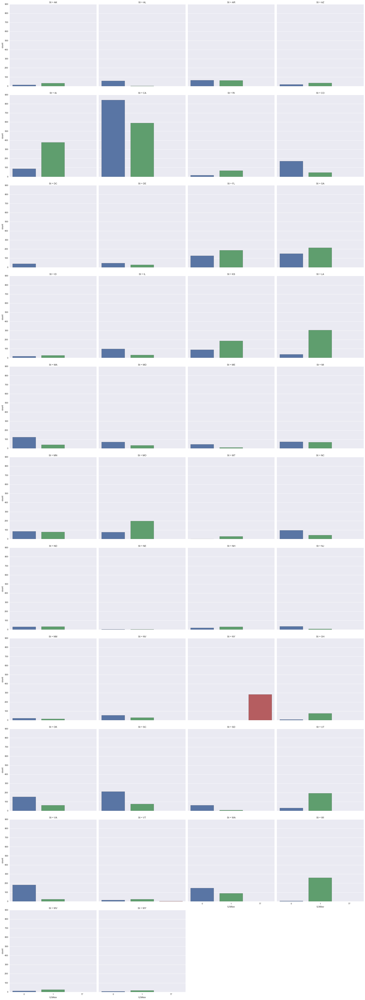

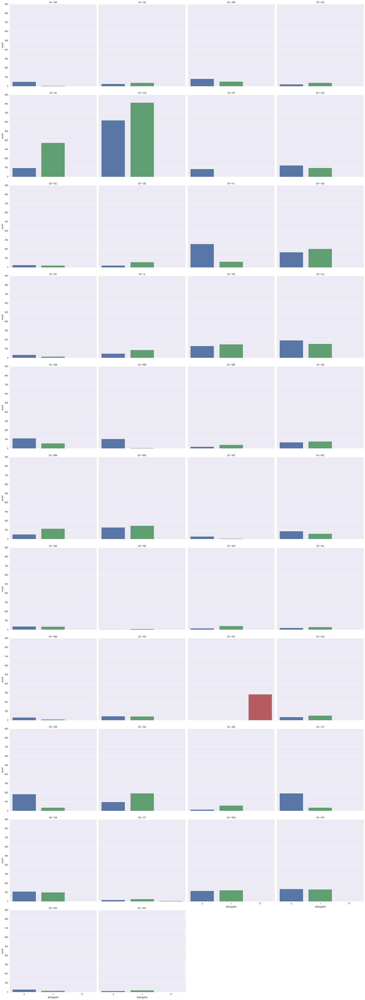

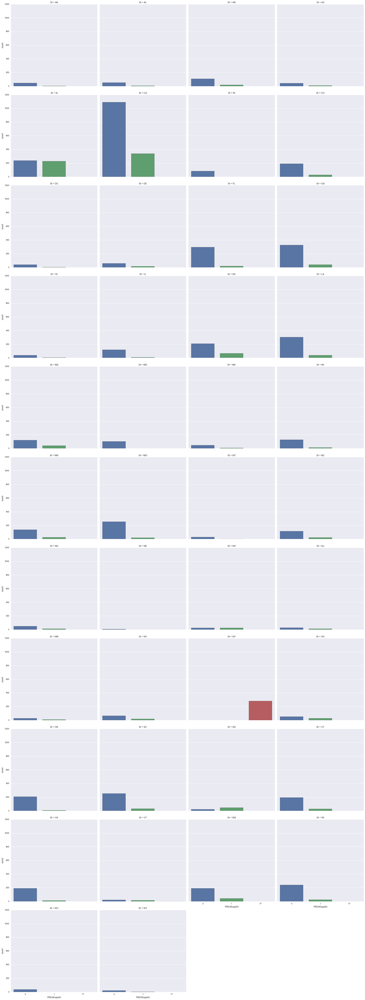

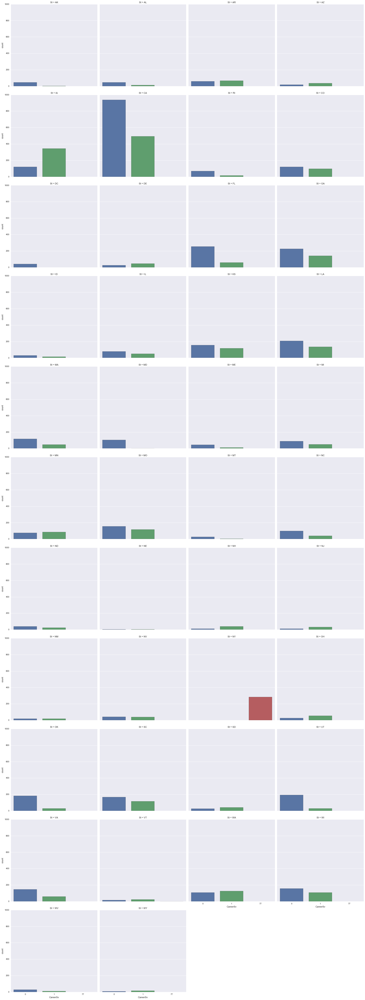

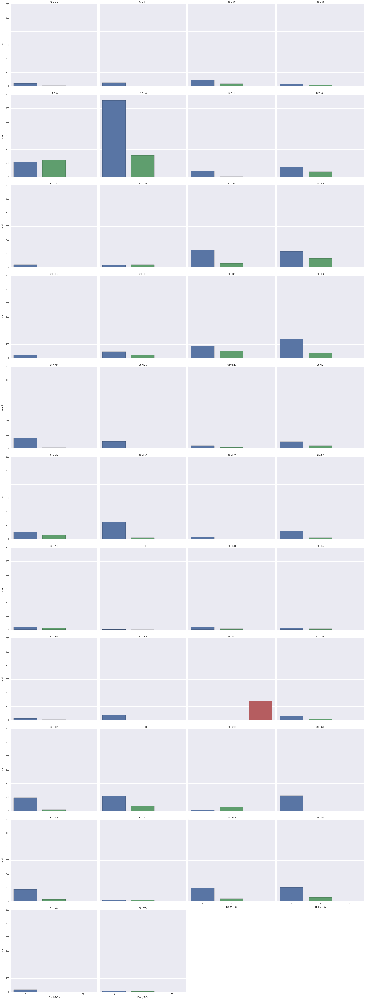

...

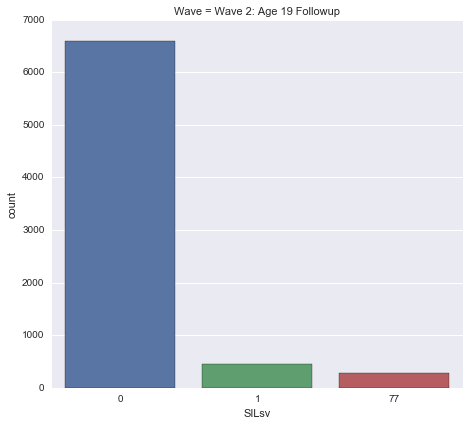

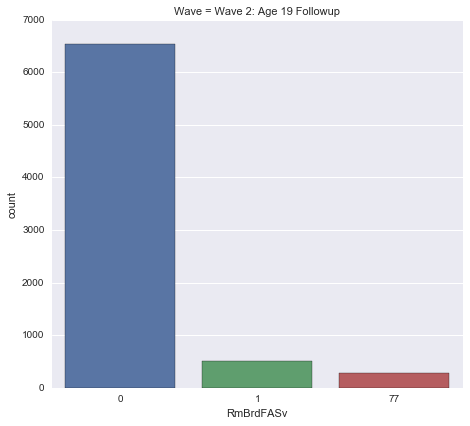

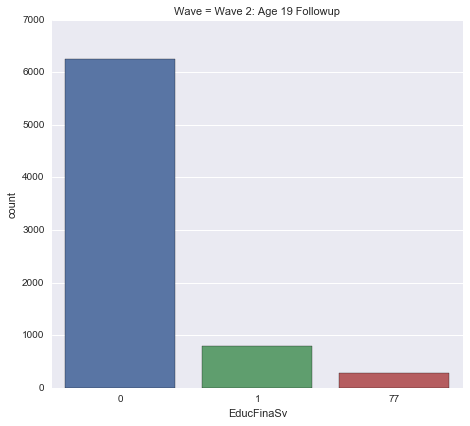

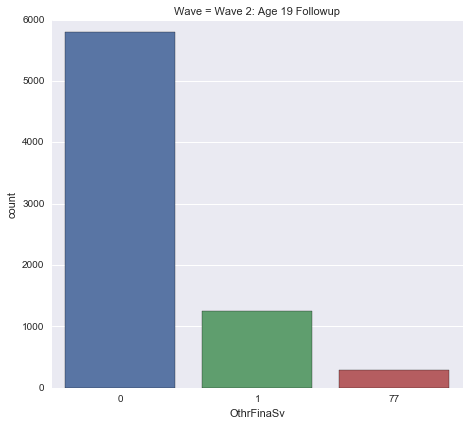

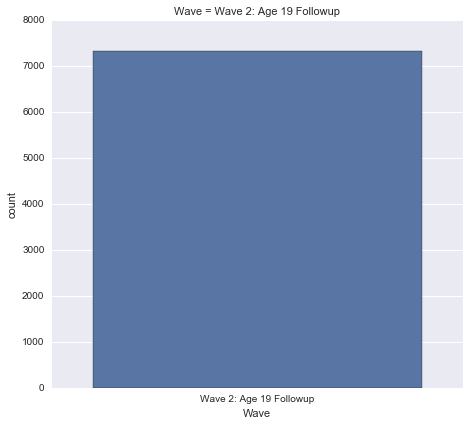

In [31]:
features_w2 = features[features.Wave == "Wave 2: Age 19 Followup"]
features_w2 = features_w2.drop('Num_services', axis=1)


for column in demographics:
    for services in features_w2:
        print column
        print services
        sns.factorplot(services, col=column, col_wrap=4, data=cohort_1_w1w2[cohort_1_w1w2.Wave == "Wave 2: Age 19 Followup"], kind="count", size=6, aspect=1)

In [32]:
demographics_W2.groupby(['AgeMP']).count()


,St,DelinqntSv,Sex,Race,TribeSv,EdLevlSv,SpecEdSv,RaceEthn,Wave
AgeMP,,,,,,,,,
16,2392,2392,2392,2392,2392,2392,2392,2392,2392
17,4936,4936,4936,4936,4936,4936,4936,4936,4936


In [33]:
print "Age 16: " +str((2392/(2392+4936.0))*100) + "%"
print "Age 17: " +str((4936/(2392+4936.0))*100) + "%"

Age 16: 32.6419213974%
Age 17: 67.3580786026%


In [34]:
for services in features_w2:
    df = cohort_1_w1w2[cohort_1_w1w2.Wave == "Wave 2: Age 19 Followup"].groupby(['Wave', services]).count()
    print df
    print 

                                StFCID  RepDate_outcomes  OutcmRpt  OutcmDte  \
Wave                    ILNAsv                                                 
Wave 2: Age 19 Followup 0         3415              3415      3415      3415   
                        1         3630              3630      3630      3630   
                        77         283               283       283       283   

                                OutcmFCS  CurrFTE  CurrPTE  PubFinAs  \
Wave                    ILNAsv                                         
Wave 2: Age 19 Followup 0           3415     3415     3415      3415   
                        1           3630     3630     3630      3630   
                        77           283      283      283       283   

                                PubFoodAs  PubHousAs  ...    HlthEdSv  \
Wave                    ILNAsv                        ...               
Wave 2: Age 19 Followup 0            3415       3415  ...        3415   
                   

In [35]:
print "ILNAsv no: " +str((3415/7328.0)*100) + "%"
print "ILNAsv yes: " +str((3630/7328.0)*100) + "%"
print "ILNAsv blank: " +str((283/7328.0)*100) + "%"
print

print "AccSuppSv no: " +str((3547/7328.0)*100) + "%"
print "AccSuppSv yes: " +str((3498/7328.0)*100) + "%"
print "AccSuppSv blank: " +str((283/7328.0)*100) + "%"
print

print "PSEdSuppSv no: " +str((5789/7328.0)*100) + "%"
print "PSEdSuppSv yes: " +str((1256/7328.0)*100) + "%"
print "PSEdSuppSv blank: " +str((283/7328.0)*100) + "%"
print

print "CareerSv no: " +str((4305/7328.0)*100) + "%"
print "CareerSv yes: " +str((2740/7328.0)*100) + "%"
print "CareerSv blank: " +str((283/7328.0)*100) + "%"
print

print "EmplyTrSv no: " +str((5338/7328.0)*100) + "%"
print "EmplyTrSv yes: " +str((1707/7328.0)*100) + "%"
print "EmplyTrSv blank: " +str((283/7328.0)*100) + "%"
print

print "BudgetSv no: " +str((4610/7328.0)*100) + "%"
print "BudgetSv yes: " +str((2435/7328.0)*100) + "%"
print "BudgetSv blank: " +str((283/7328.0)*100) + "%"
print

print "HousEdSv no: " +str((4559/7328.0)*100) + "%"
print "HousEdSv yes: " +str((2486/7328.0)*100) + "%"
print "HousEdSv blank: " +str((283/7328.0)*100) + "%"
print

print "HlthEdSv no: " +str((4436/7328.0)*100) + "%"
print "HlthEdSv yes: " +str((2609/7328.0)*100) + "%"
print "HlthEdSv blank: " +str((283/7328.0)*100) + "%"
print

print "FamSuppSv no: " +str((4934/7328.0)*100) + "%"
print "FamSuppSv yes: " +str((2111/7328.0)*100) + "%"
print "FamSuppSv blank: " +str((283/7328.0)*100) + "%"

ILNAsv no: 46.6020742358%
ILNAsv yes: 49.5360262009%
ILNAsv blank: 3.86189956332%

AccSuppSv no: 48.4033842795%
AccSuppSv yes: 47.7347161572%
AccSuppSv blank: 3.86189956332%

PSEdSuppSv no: 78.9983624454%
PSEdSuppSv yes: 17.1397379913%
PSEdSuppSv blank: 3.86189956332%

CareerSv no: 58.7472707424%
CareerSv yes: 37.3908296943%
CareerSv blank: 3.86189956332%

EmplyTrSv no: 72.8438864629%
EmplyTrSv yes: 23.2942139738%
EmplyTrSv blank: 3.86189956332%

BudgetSv no: 62.9093886463%
BudgetSv yes: 33.2287117904%
BudgetSv blank: 3.86189956332%

HousEdSv no: 62.2134279476%
HousEdSv yes: 33.9246724891%
HousEdSv blank: 3.86189956332%

HlthEdSv no: 60.5349344978%
HlthEdSv yes: 35.6031659389%
HlthEdSv blank: 3.86189956332%

FamSuppSv no: 67.3307860262%
FamSuppSv yes: 28.8073144105%
FamSuppSv blank: 3.86189956332%


In [36]:
print "MentorSv no: " +str((5645/7328.0)*100) + "%"
print "MentorSv yes: " +str((1400/7328.0)*100) + "%"
print "MentorSv blank: " +str((283/7328.0)*100) + "%"
print

print "SILsv no: " +str((6602/7328.0)*100) + "%"
print "SILsv yes: " +str((443/7328.0)*100) + "%"
print "SILsv blank: " +str((283/7328.0)*100) + "%"
print

print "RmBrdFASv no: " +str((6529/7328.0)*100) + "%"
print "RmBrdFASv yes: " +str((516/7328.0)*100) + "%"
print "RmBrdFASv blank: " +str((283/7328.0)*100) + "%"
print

print "EducFinaSv no: " +str((6257/7328.0)*100) + "%"
print "EducFinaSv yes: " +str((788/7328.0)*100) + "%"
print "EducFinaSv blank: " +str((283/7328.0)*100) + "%"
print

print "OthrFinaSv no: " +str((5798/7328.0)*100) + "%"
print "OthrFinaSv yes: " +str((1247/7328.0)*100) + "%"
print "OthrFinaSv blank: " +str((283/7328.0)*100) + "%"
print

MentorSv no: 77.0332969432%
MentorSv yes: 19.1048034934%
MentorSv blank: 3.86189956332%

SILsv no: 90.0927947598%
SILsv yes: 6.04530567686%
SILsv blank: 3.86189956332%

RmBrdFASv no: 89.0966157205%
RmBrdFASv yes: 7.04148471616%
RmBrdFASv blank: 3.86189956332%

EducFinaSv no: 85.3848253275%
EducFinaSv yes: 10.7532751092%
EducFinaSv blank: 3.86189956332%

OthrFinaSv no: 79.1211790393%
OthrFinaSv yes: 17.0169213974%
OthrFinaSv blank: 3.86189956332%



1     1919
2     1148
3      911
4      718
5      597
6      477
7      371
8      314
0      291
9      212
10     140
13      93
11      83
12      48
14       6
Name: Num_services, dtype: int64

% who received 0 services: 3.971069869%
% who received 1 service: 26.1872270742%
% who received 2 services: 15.6659388646%
% who received 3 services: 12.431768559%
% who received 4 services: 9.7980349345%
% who received 5 services: 8.14683406114%
% who received 6 services: 6.50927947598%
% who received 7 services: 5.06277292576%
% who received 8 services: 4.28493449782%
% who received 9 services: 2.89301310044%
% who received 10 services: 1.91048034934%
% who received 11 services: 1.1326419214%
% who received 12 services: 0.655021834061%
% who received 13 services: 1.26910480349%
% who received 14 services: 0.0818777292576%



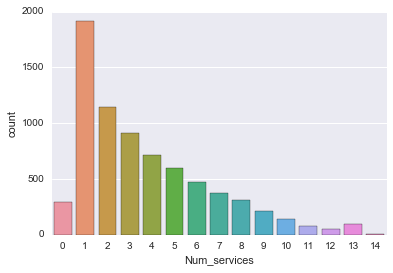

In [37]:
df_w2 = features[features.Wave=="Wave 2: Age 19 Followup"]

sns.countplot(data = df_w2, x = 'Num_services')

print df_w2.Num_services.value_counts()
print

print "% who received 0 services: " + str((291/7328.0)*100) + "%"
print "% who received 1 service: " +str((1919/7328.0)*100) + "%"
print "% who received 2 services: " +str((1148/7328.0)*100) + "%"
print "% who received 3 services: " +str((911/7328.0)*100) + "%"
print "% who received 4 services: " +str((718/7328.0)*100) + "%"
print "% who received 5 services: " +str((597/7328.0)*100) + "%"
print "% who received 6 services: " +str((477/7328.0)*100) + "%"
print "% who received 7 services: " +str((371/7328.0)*100) + "%"
print "% who received 8 services: " +str((314/7328.0)*100) + "%"
print "% who received 9 services: " +str((212/7328.0)*100) + "%"
print "% who received 10 services: " +str((140/7328.0)*100) + "%"
print "% who received 11 services: " +str((83/7328.0)*100) + "%"
print "% who received 12 services: " +str((48/7328.0)*100) + "%"
print "% who received 13 services: " +str((93/7328.0)*100) + "%"
print "% who received 14 services: " +str((6/7328.0)*100) + "%"


print

# Outcomes by demographics

St
PubFoodAs
St
PubHousAs
St
OthrFinAs
St
HighEdCert
St
CurrFTE
St
CurrPTE
St
PubFinAs
St
CurrenRoll
St
PrescripIn
St
Homeless
St
SubAbuse
St
Incarc
St
Medicaid
St
OthrHlthIn
St
MedicalIn
St
MentlHlthIn
St
Wave
DelinqntSv
PubFoodAs
DelinqntSv
PubHousAs
DelinqntSv
OthrFinAs
DelinqntSv
HighEdCert
DelinqntSv
CurrFTE
DelinqntSv
CurrPTE
DelinqntSv
PubFinAs
DelinqntSv
CurrenRoll
DelinqntSv
PrescripIn
DelinqntSv
Homeless
DelinqntSv
SubAbuse
DelinqntSv
Incarc
DelinqntSv
Medicaid
DelinqntSv
OthrHlthIn
DelinqntSv
MedicalIn
DelinqntSv
MentlHlthIn
DelinqntSv
Wave
Sex
PubFoodAs
Sex
PubHousAs
Sex
OthrFinAs
Sex
HighEdCert
Sex
CurrFTE
Sex
CurrPTE
Sex
PubFinAs
Sex
CurrenRoll
Sex
PrescripIn
Sex
Homeless
Sex
SubAbuse
Sex
Incarc
Sex
Medicaid
Sex
OthrHlthIn
Sex
MedicalIn
Sex
MentlHlthIn
Sex
Wave
Race
PubFoodAs
Race
PubHousAs
Race
OthrFinAs
Race
HighEdCert
Race
CurrFTE
Race
CurrPTE
Race
PubFinAs
Race
CurrenRoll
Race
PrescripIn
Race
Homeless
Race
SubAbuse
Race
Incarc
Race
Medicaid
Race
OthrHlthIn
Race
Medica

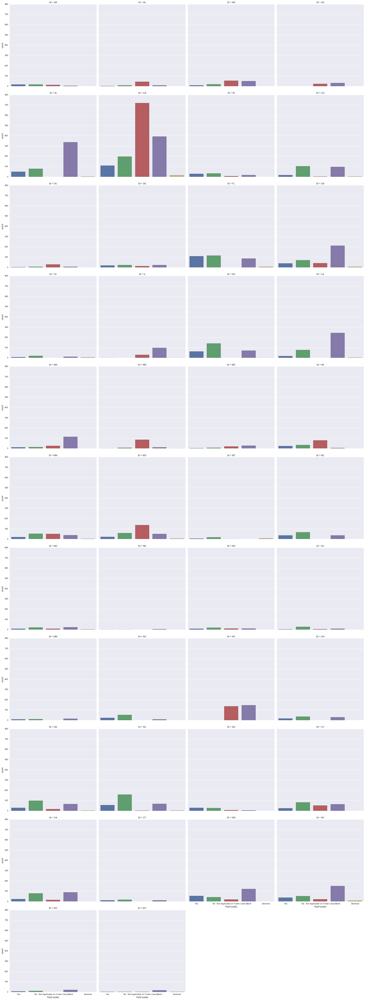

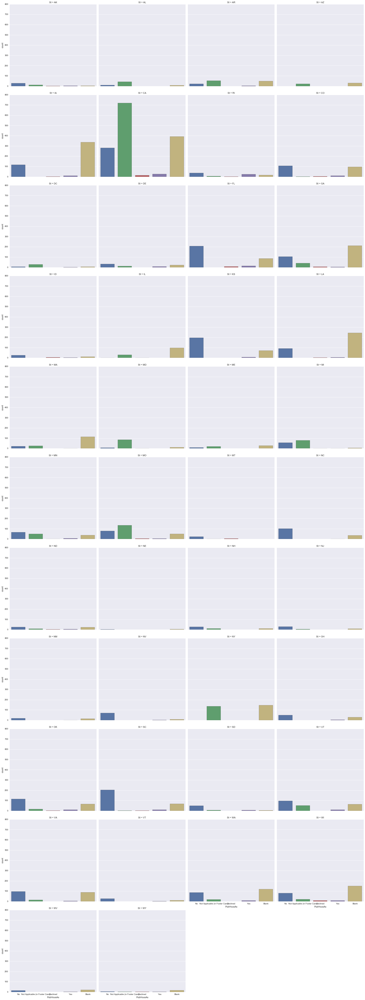

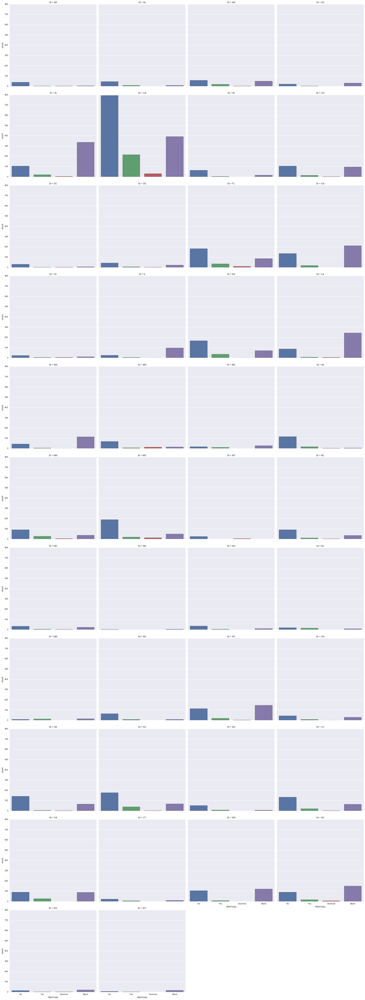

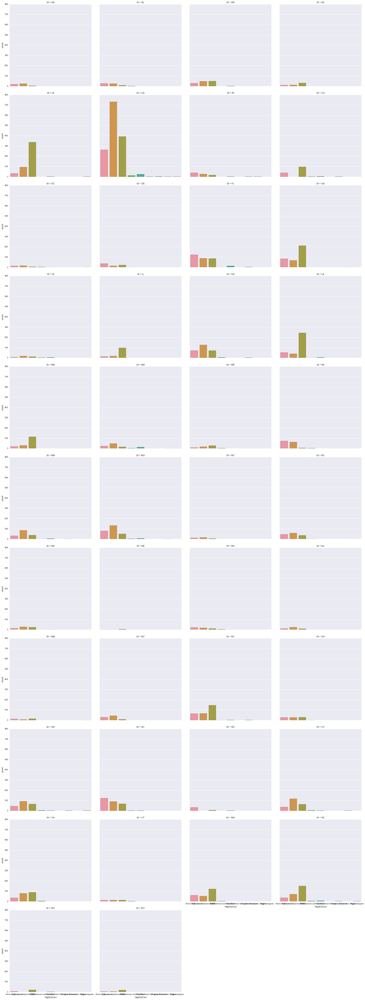

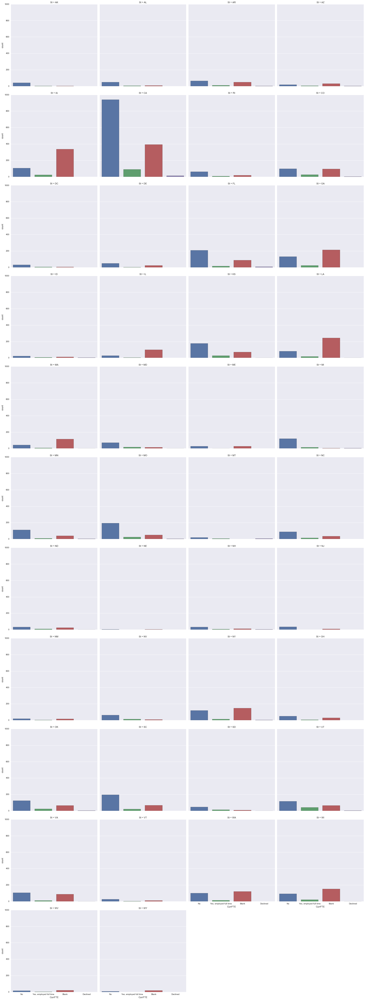

...

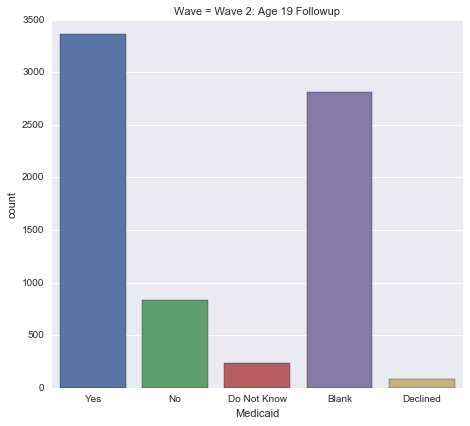

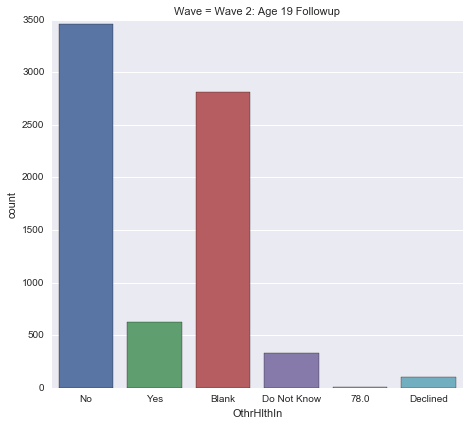

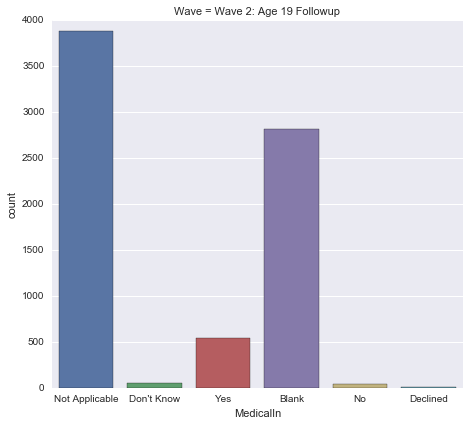

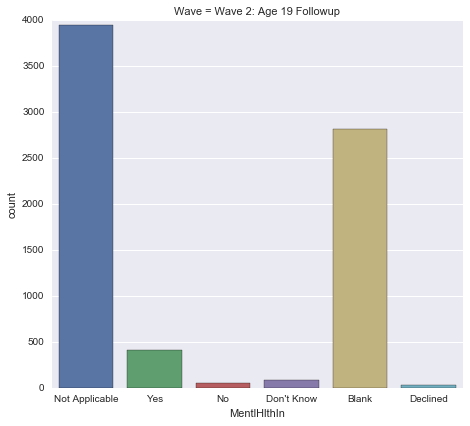

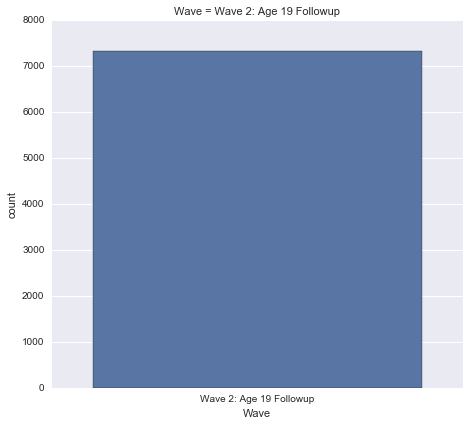

In [38]:
targets_w2 = targets[targets.Wave == "Wave 2: Age 19 Followup"]


for column in demographics:
    for outcomes in targets_w2:
#         print column
#         print outcomes
        sns.factorplot(outcomes, col=column, col_wrap=4, data=cohort_1_w1w2[cohort_1_w1w2.Wave == "Wave 2: Age 19 Followup"], kind="count", size=6, aspect=1)

# 3) BIVARIATE ANALYSIS

### LOOKING AT RELATIONSHIPS WITHIN FEATURES

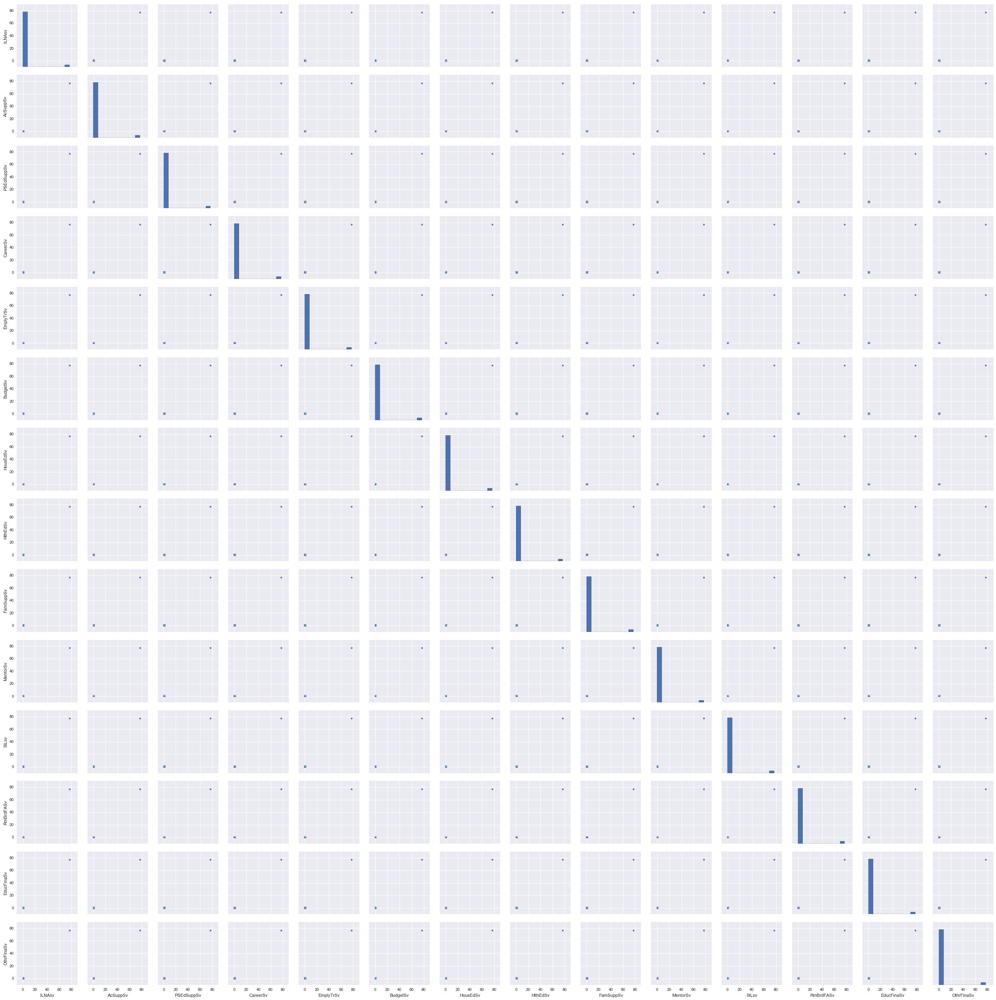

In [39]:
features_noNum = features.drop('Num_services', axis=1)

sns.pairplot(features_noNum)

### LOOKING AT RELATIONSHIPS WITHIN TARGETS

In [40]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

for column in targets_w2:
    targets_w2[column] = le.fit_transform(targets_w2[column])



/Users/cguy/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [41]:
targets_w2.head()

,PubFoodAs,PubHousAs,OthrFinAs,HighEdCert,CurrFTE,CurrPTE,PubFinAs,CurrenRoll,PrescripIn,Homeless,SubAbuse,Incarc,Medicaid,OthrHlthIn,MedicalIn,MentlHlthIn,Wave
2,4,2,2,7,2,2,2,2,4,3,2,2,4,4,4,4,0
6,2,2,2,5,2,2,2,2,4,2,2,2,3,4,4,4,0
12,4,2,2,5,2,2,2,3,4,2,3,3,4,4,4,4,0
15,4,2,2,5,2,3,2,2,4,3,2,2,4,4,4,4,0
18,4,2,2,5,3,2,2,2,4,3,2,2,4,5,2,4,0


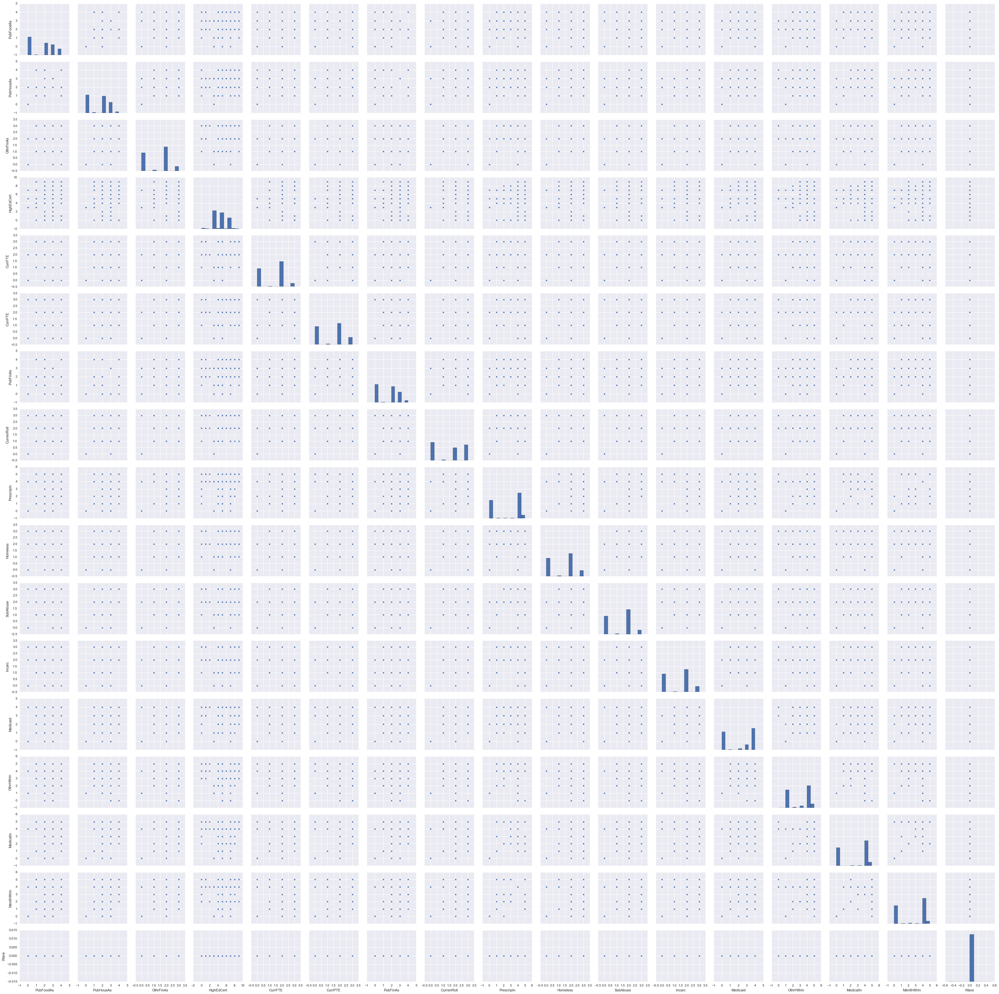

In [42]:
sns.pairplot(targets_w2)

### LOOKING AT RELATIONSHIPS BETWEEN TARGETS AND FEATURES

In [43]:
# Still working on this section...having issues rendering a pairplot....maybe too many variables?

features_w2 = features[features.Wave == "Wave 2: Age 19 Followup"]
all_in_one = pd.concat([targets_w2, features_w2], axis=1,join_axes=[targets_w2.index])

all_in_one.head()

,PubFoodAs,PubHousAs,OthrFinAs,HighEdCert,CurrFTE,CurrPTE,PubFinAs,CurrenRoll,PrescripIn,Homeless,...,HousEdSv,HlthEdSv,FamSuppSv,MentorSv,SILsv,RmBrdFASv,EducFinaSv,OthrFinaSv,Wave,Num_services
2,4,2,2,7,2,2,2,2,4,3,...,1,0,0,0,0,0,0,1,Wave 2: Age 19 Followup,2
6,2,2,2,5,2,2,2,2,4,2,...,0,0,0,0,0,0,0,0,Wave 2: Age 19 Followup,1
12,4,2,2,5,2,2,2,3,4,2,...,0,0,0,0,0,0,1,1,Wave 2: Age 19 Followup,3
15,4,2,2,5,2,3,2,2,4,3,...,0,0,0,0,0,0,0,0,Wave 2: Age 19 Followup,1
18,4,2,2,5,3,2,2,2,4,3,...,0,0,0,0,0,0,0,1,Wave 2: Age 19 Followup,2


In [44]:
all_in_one.columns

Index([u'PubFoodAs', u'PubHousAs', u'OthrFinAs', u'HighEdCert', u'CurrFTE',
       u'CurrPTE', u'PubFinAs', u'CurrenRoll', u'PrescripIn', u'Homeless',
       u'SubAbuse', u'Incarc', u'Medicaid', u'OthrHlthIn', u'MedicalIn',
       u'MentlHlthIn', u'Wave', u'ILNAsv', u'AcSuppSv', u'PSEdSuppSv',
       u'CareerSv', u'EmplyTrSv', u'BudgetSv', u'HousEdSv', u'HlthEdSv',
       u'FamSuppSv', u'MentorSv', u'SILsv', u'RmBrdFASv', u'EducFinaSv',
       u'OthrFinaSv', u'Wave', u'Num_services'],
      dtype='object')

# Saving dataset for later use in analysis

In [45]:
cohort_1_w1w2.to_csv('cohort_1_w1w2.csv')

In [46]:
# Cells below contain my attempts as features vs targets plots....

In [152]:
# all_in_one.columns

indexed_df = all_in_place.set_index(['FYouth'])
indexed_df

,PubFoodAs,PubHousAs,OthrFinAs,HighEdCert,CurrFTE,CurrPTE,PubFinAs,CurrenRoll,PrescripIn,Homeless,...,HousEdSv,HlthEdSv,FamSuppSv,MentorSv,SILsv,RmBrdFASv,EducFinaSv,OthrFinaSv,Wave,Num_services
FYouth,,,,,,,,,,,,,,,,,,,,,
2,4,2,2,7,2,2,2,2,4,3,...,1,0,0,0,0,0,0,1,Wave 2: Age 19 Followup,2
6,2,2,2,5,2,2,2,2,4,2,...,0,0,0,0,0,0,0,0,Wave 2: Age 19 Followup,1
12,4,2,2,5,2,2,2,3,4,2,...,0,0,0,0,0,0,1,1,Wave 2: Age 19 Followup,3
15,4,2,2,5,2,3,2,2,4,3,...,0,0,0,0,0,0,0,0,Wave 2: Age 19 Followup,1
18,4,2,2,5,3,2,2,2,4,3,...,0,0,0,0,0,0,0,1,Wave 2: Age 19 Followup,2
20,3,3,2,7,2,2,3,3,4,2,...,0,0,0,0,0,0,0,1,Wave 2: Age 19 Followup,1
23,3,3,2,7,2,2,3,3,5,2,...,1,1,0,0,0,0,0,1,Wave 2: Age 19 Followup,4
27,2,2,2,5,2,2,2,2,5,2,...,0,0,0,0,0,0,0,1,Wave 2: Age 19 Followup,2
30,4,2,2,7,3,2,2,2,4,3,...,0,0,0,0,0,0,0,1,Wave 2: Age 19 Followup,1


In [154]:
for service in features:
    for outcome in targets:
        print service
        print outcome
        sns.factorplot(outcome, col=service, col_wrap=4, data= indexed_df, kind="point", size=6, aspect=1)

ILNAsv
PubFoodAs


TypeError: cannot label index with a null key

In [45]:
targets.columns

Index([u'PubFoodAs', u'PubHousAs', u'OthrFinAs', u'HighEdCert', u'CurrFTE',
       u'CurrPTE', u'PubFinAs', u'CurrenRoll', u'PrescripIn', u'Homeless',
       u'SubAbuse', u'Incarc', u'Medicaid', u'OthrHlthIn', u'MedicalIn',
       u'MentlHlthIn', u'Wave'],
      dtype='object')

In [46]:

for service in features:
    for outcome in targets:
        print service
        print outcome
        sns.factorplot(x=service, y=outcome, hue="Wave", col= 'Sex',data=cohort_1_w1w2,size=5, aspect=.8,kind="bar",col_wrap=3)

ILNAsv


ValueError: cannot label index with a null key